In [1]:
import torch
from torchvision import models, transforms
from PIL import Image
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision.models.detection import FCOS_ResNet50_FPN_Weights
import xml.etree.ElementTree as ET
# Set device (GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Object detection pipeline

* Using a pretrained pytorch model (https://pytorch.org/vision/main/models/generated/torchvision.models.detection.fcos_resnet50_fpn.html#torchvision.models.detection.fcos_resnet50_fpn)


In [ ]:
# Load the pre-trained FCOS model
model = models.detection.fcos_resnet50_fpn(weights=FCOS_ResNet50_FPN_Weights.DEFAULT)
model.to(device)
model.eval()

# Define image transformation. Importantly, the above model 
# expects pixel values between 0 and 1, so no std mean normalization should be used.
transform = transforms.Compose([
    transforms.ToTensor(),
])

### Running the inference.

* The detected bboxes are red, the ground truth bboxes from Carla are green.
* Actually it does make the impression, especially for the later images, below, that the Carla bboxes are slightly too large.

In [ ]:
image_folder = "output"
file_names = os.listdir(image_folder)
file_names = list(set([file_name.split('.')[0] for file_name in file_names]))
file_names.sort()
# only taking a subset of the samples in order to keep the notebook small
file_names = file_names[::10]

001673


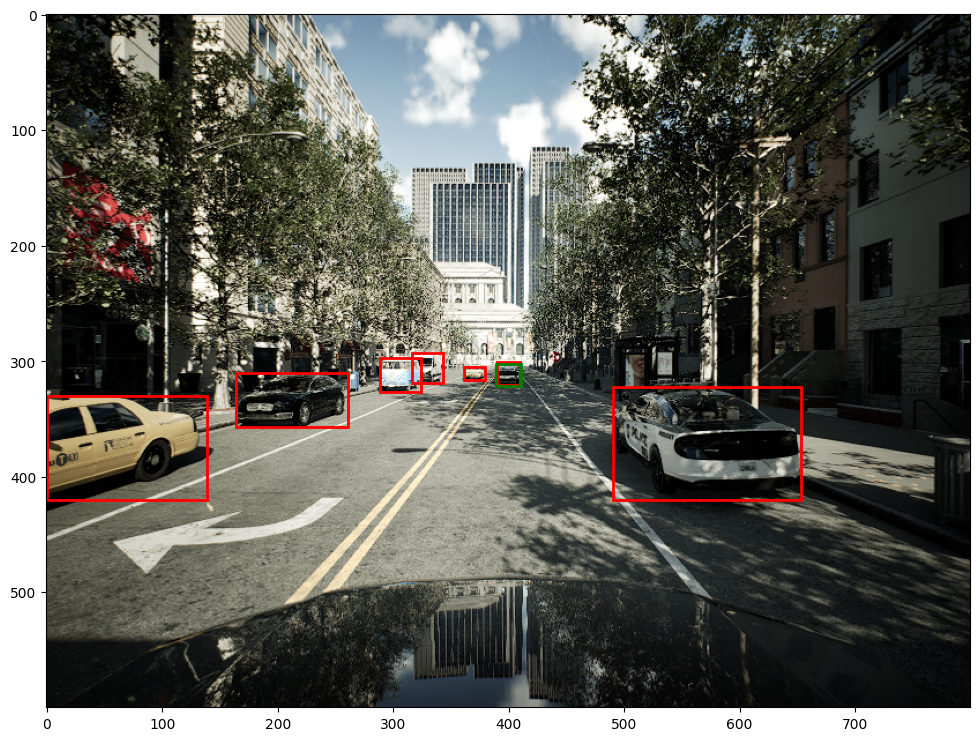

001683


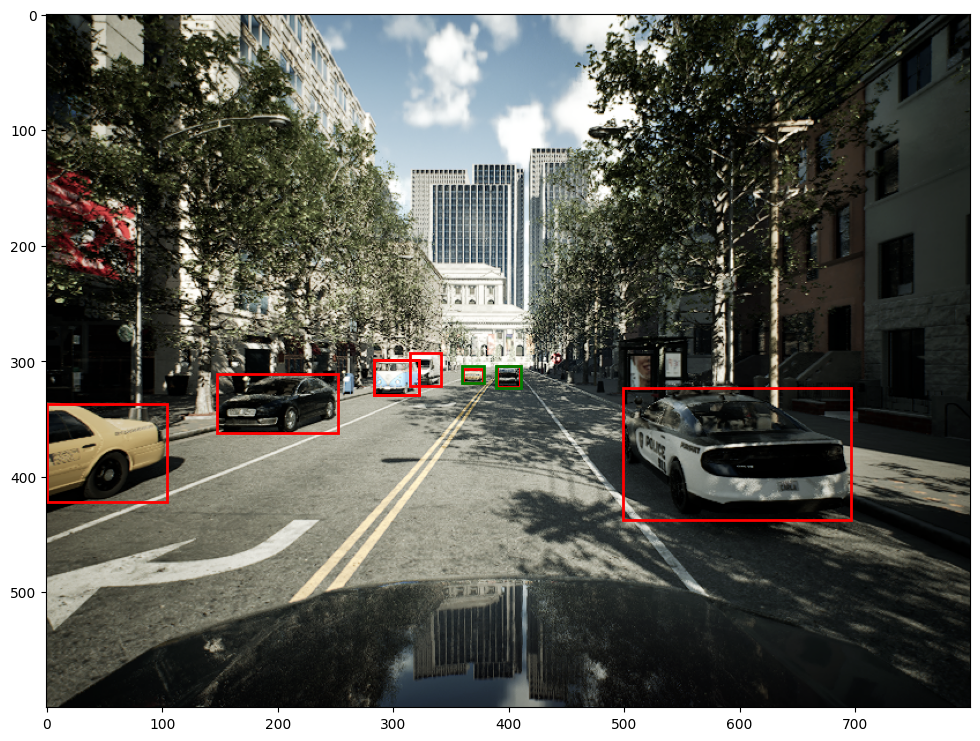

001693


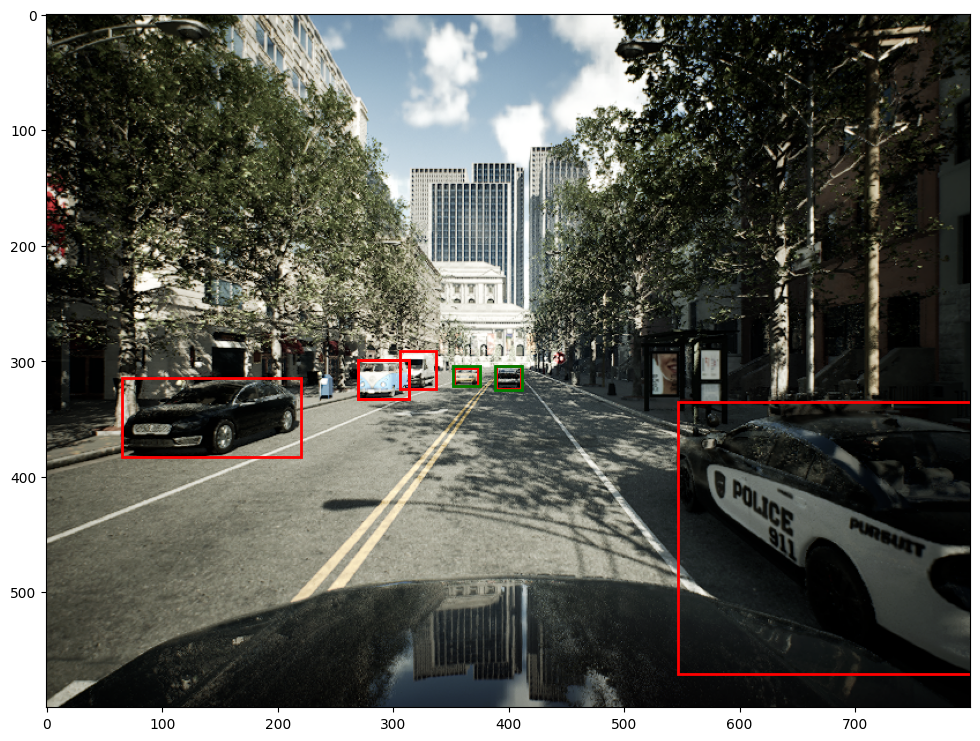

001703


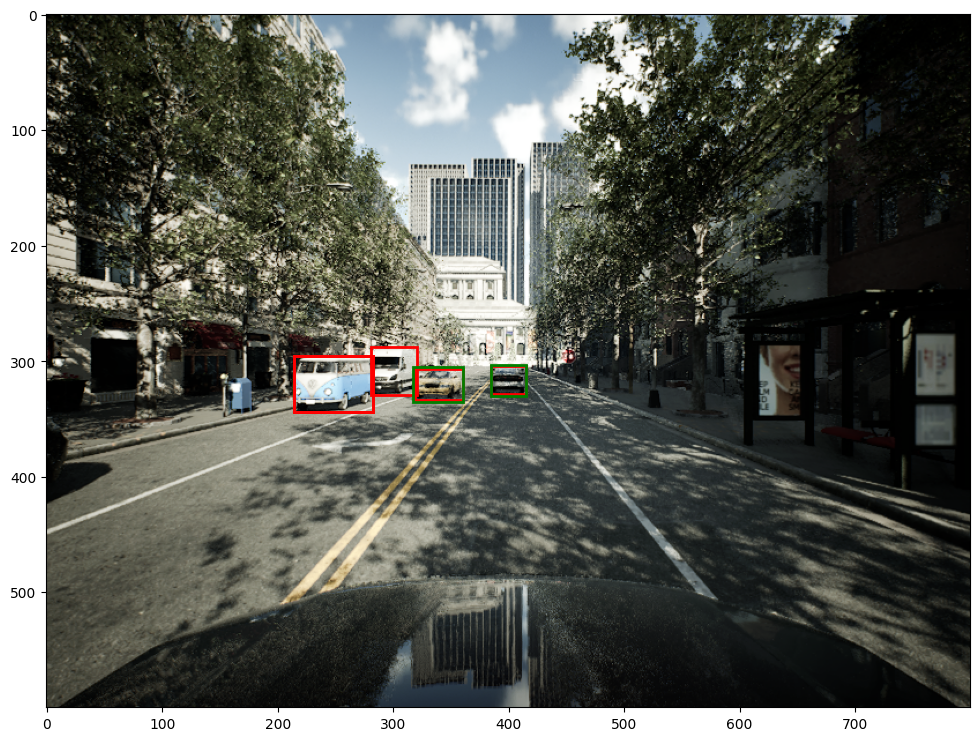

001713


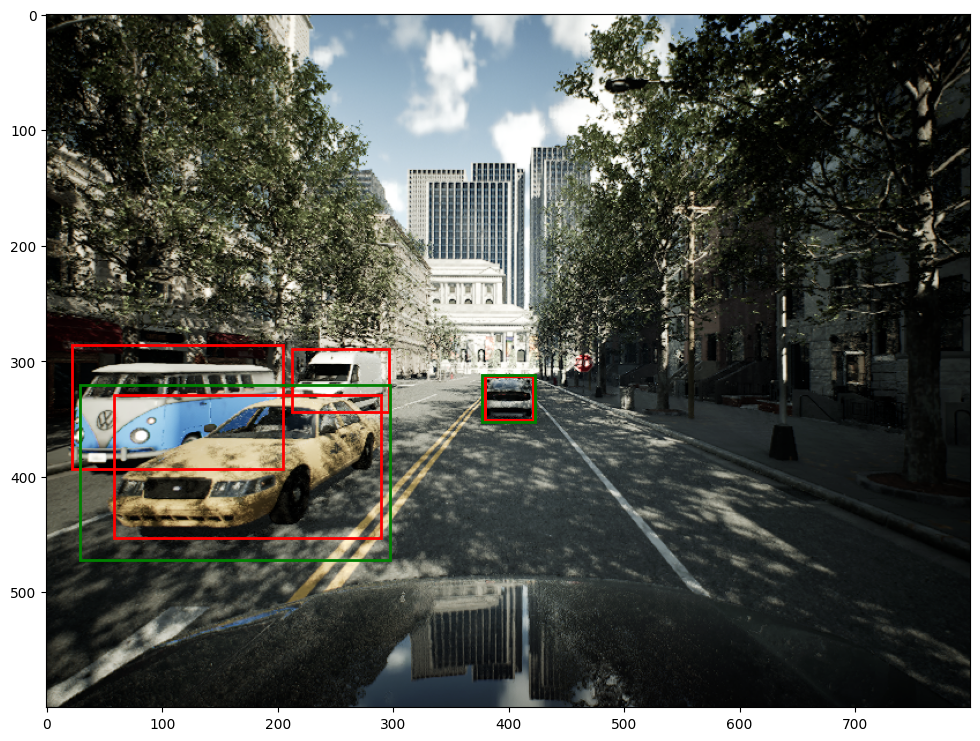

001723


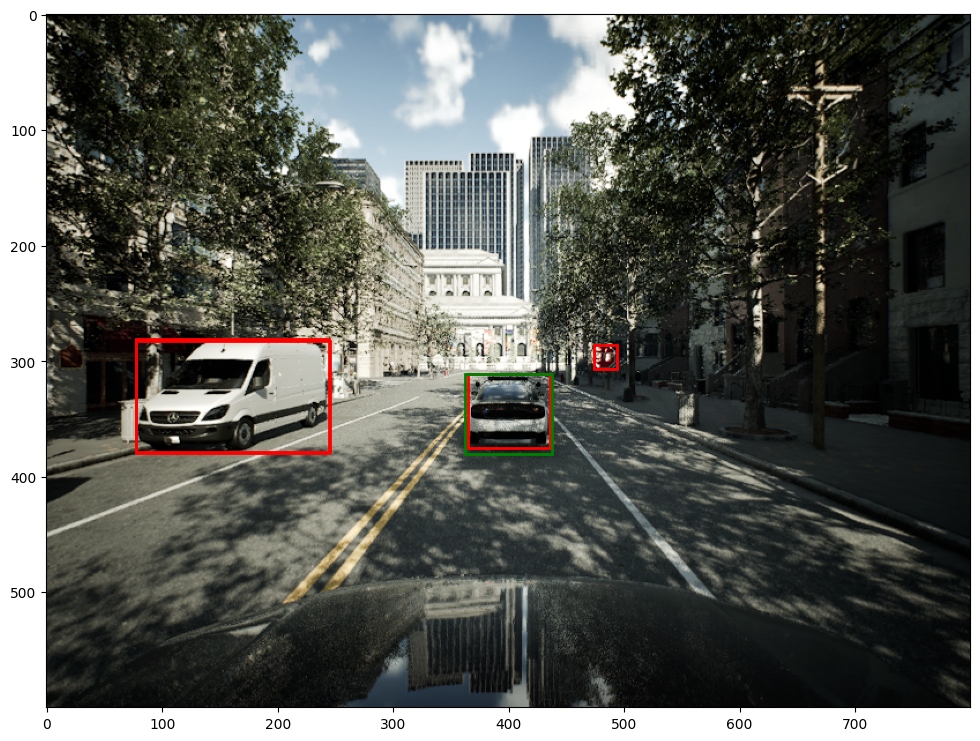

001733


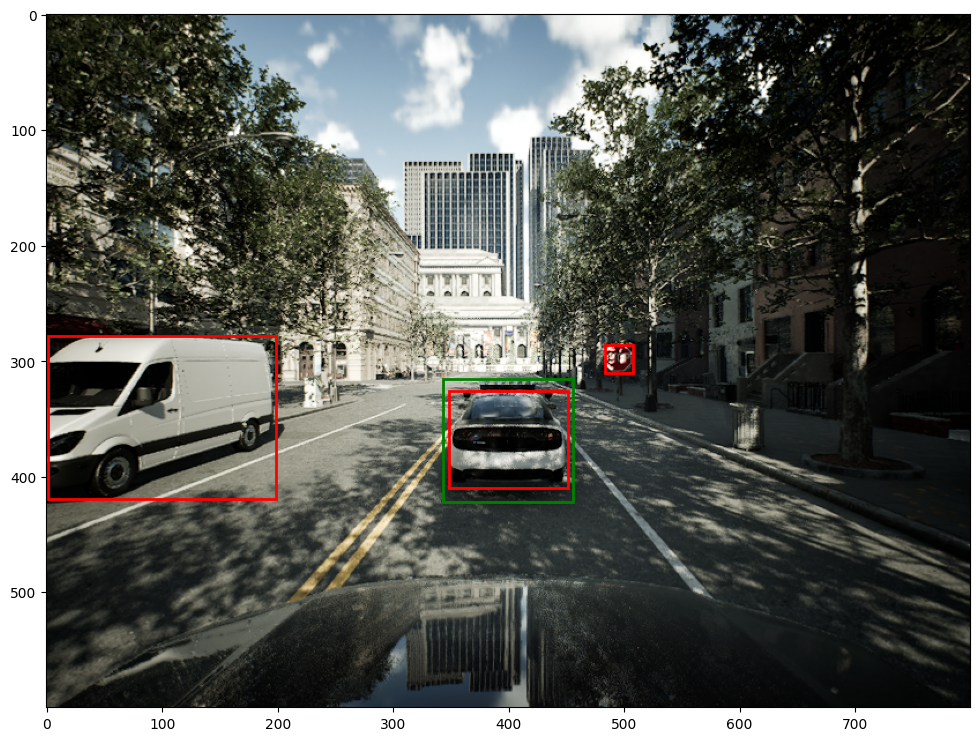

001743


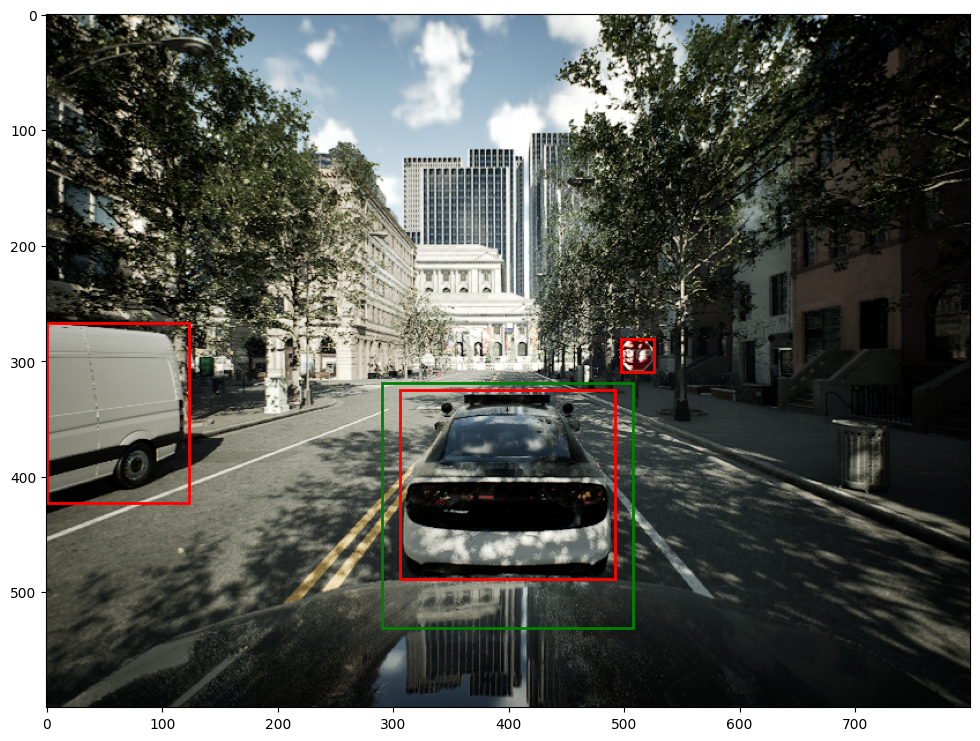

001753


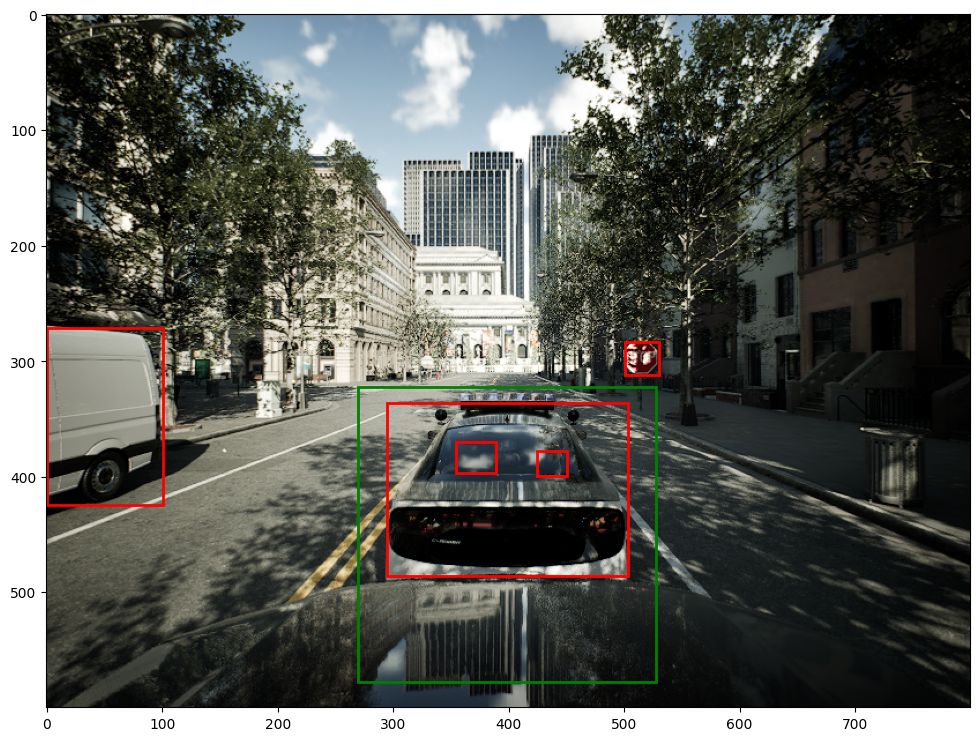

001763


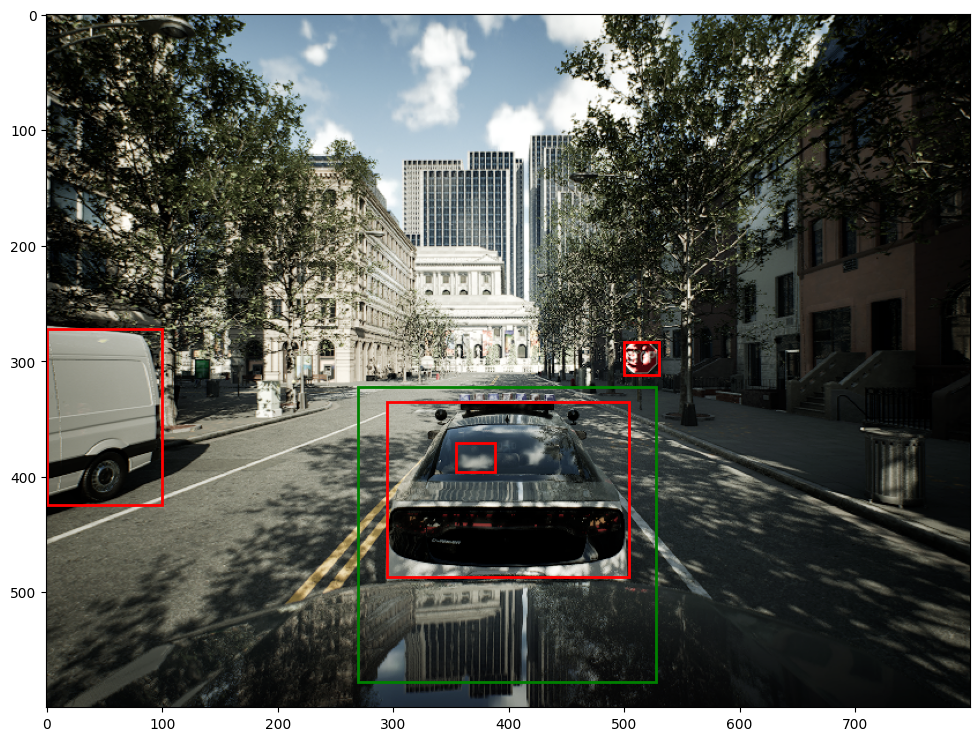

In [ ]:
# Inference loop for all images in the 'out' folder
threshold = 0.5
for image_file in file_names:

    image_path = os.path.join(image_folder, f'{image_file}.png')
    image_pil = Image.open(image_path).convert("RGB")
    image = transform(image_pil).unsqueeze(0)
    image = image.to(device)
    with torch.no_grad():
        predictions = model(image)
    boxes = predictions[0]['boxes'].cpu().numpy()
    scores = predictions[0]['scores'].cpu().numpy()

    # Filter out predictions below the threshold
    filtered_boxes = [box for box, score in zip(boxes, scores) if score > threshold]

    # Plot the image and draw bounding boxes
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(image_pil)
    for box in filtered_boxes:
        x_min, y_min, x_max, y_max = box
        rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                    linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

    # Get the ground truth data
    tree = ET.parse(os.path.join(image_folder, f'{image_file}.xml'))
    root = tree.getroot()

    obj = root.findall('object')[0]
    obj.find('name').text
    float(obj.find('bndbox').find('xmin').text)

    gt_boxes = []
    for obj in root.findall('object'):
        name = obj.find('name').text
        bndbox = obj.find('bndbox')
        xmin = float(bndbox.find('xmin').text)
        ymin = float(bndbox.find('ymin').text)
        xmax = float(bndbox.find('xmax').text)
        ymax = float(bndbox.find('ymax').text)
        gt_boxes.append((name, (xmin, ymin, xmax, ymax)))

    for label, (xmin, ymin, xmax, ymax) in gt_boxes:
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='green', facecolor='none')
        ax.add_patch(rect)

    plt.show()


### Next potential part would be to use the detections for a planning algo
